In [44]:
import librosa, librosa.display
import numpy as np
import matplotlib.pyplot as plt
import os
import math
import scipy
import pandas as pd

In [16]:
def wave_length(data, zero_index, min_guess, max_guess): 
    #data should be an array of amplitudes? maybe at the main frequency?
    size = data.shape[0]
    xval = np.zeros(size, dtype=float, order='C')
    for i in range(0,size):
        xval[i] = i-zero_index
    
    #scale down data slowly
    scale = np.zeros(size, dtype=float, order='C')
    xval = np.zeros(size, dtype=float, order='C')
    for i in range(0,size):
        xval[i] = i-zero_index

        #creating a piecewise linear scaler that weights the frequencies near the maximum more
        if np.absolute(i-zero_index)<2*max_guess:
            scale[i] = 1
        elif np.absolute(i-zero_index)>6*max_guess:
            scale[i] = 0
        else:
            scale[i] = 1.5-np.absolute(i-zero_index)/(4*max_guess)
    scaled_data = np.multiply(data,scale)
    norm = np.dot(scaled_data,scaled_data)
    
    #find best fitting wave
    best_fit = 0
    wavelength = 0
    wave_fit = 0
    #if someone wants you could try and replace this with a binary search for speed
    for i in range(min_guess,max_guess+1):
        #create cos values
        cosval = np.cos((2*math.pi/i)*(xval))
        
        #integrate data values
        wave_fit = np.dot(cosval,scaled_data)/np.dot(cosval,cosval)
        if wave_fit> best_fit:
            best_fit = wave_fit
            wavelength = i
    return wavelength, best_fit/norm

In [13]:
def wave_guess(D):
    max_value = np.max(D)
    min_value = np.min(D)
    zero_index = np.unravel_index(np.argmax(D), D.shape)[0]
    print (zero_index)
    threshold_end = (max_value - min_value) * .3 + min_value # set the amplitude threshold that marks the end of a syllable
    threshold_start = (max_value - min_value) * .7 + min_value# sets the amplitude threshold that marks the start of the next syllable    

    i=1
    bool1 = True
    while bool1:
        if zero_index+i>len(D)-2:
            print ('never reached end threshold')
            return None
        elif data[zero_index + i] <threshold_end:
            bool1 = False
        i = i+1
    
    bool1 = True
    while bool1: 
        if zero_index+i>len(D)-2:
            print ('never reached end threshold')
            return None
        elif data[zero_index + i] >threshold_start:
            bool1 = False
        i = i+1
    lower = i
    
    bool1 = True
    while bool1:
        if zero_index+i>len(D)-2:
            print ('never reached end threshold')
            return None
        elif data[zero_index + i] <threshold_end:
            bool1 = False
        i = i+1
    upper = i
    
    return zero_index, lower, upper

In [19]:
def fft_wavelength(data):
    data2 = data- data.mean()
    fft = scipy.fft.fft(data2)
    out = np.absolute(fft)
    return out

In [5]:
def remove_low(f):
    song, sr = librosa.load(f)
    D = np.abs(librosa.stft(song, n_fft=n_fft,  hop_length=hop_length))
    #FIND OUT HOW MANY FREQUENCIES WE REMOVED HERE!
    D=D[64:]
    return D

(431,)
(961, 431)


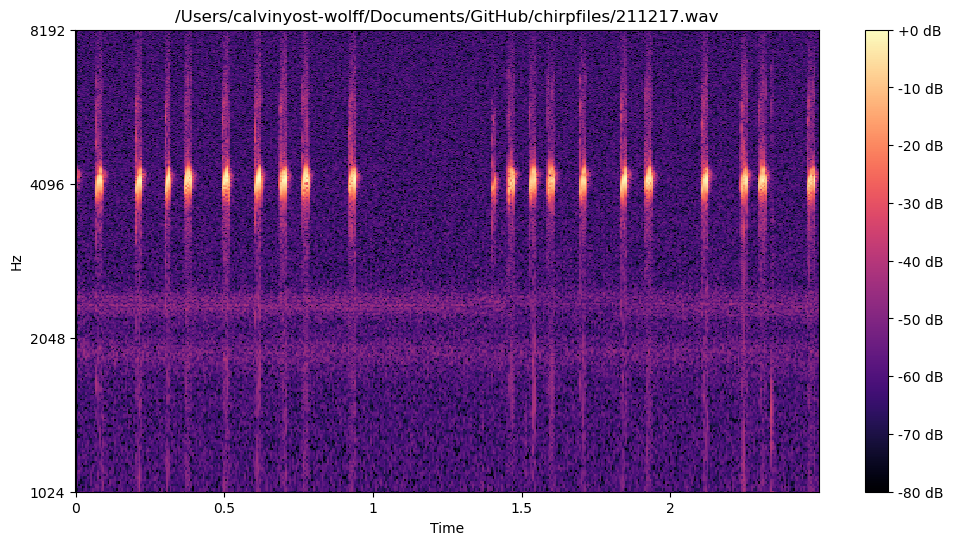

107
never reached end threshold


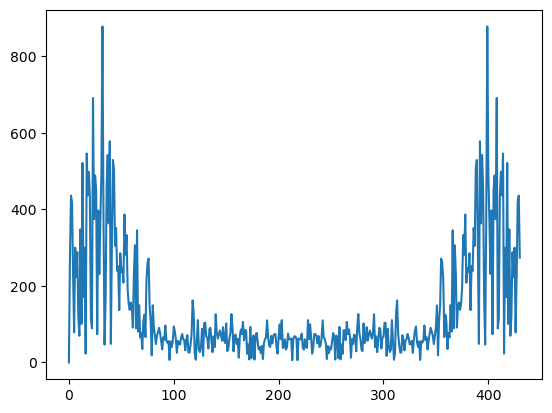

(32,)


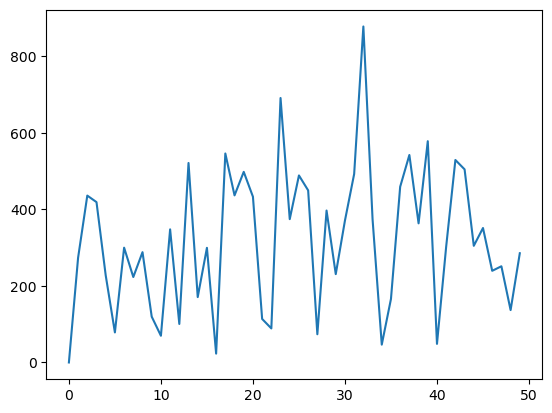

In [41]:
hop_length = 1024
n_fft = 2048
f = '/Users/calvinyost-wolff/Documents/GitHub/chirpfiles/211217.wav'
freq = 4096
D = remove_low(f)
data = D.sum(axis=0)
data = librosa.amplitude_to_db(data, ref=np.max)
print (data.shape)
DB = librosa.amplitude_to_db(D, ref=np.max)
print (DB.shape)
plt.figure(figsize=(12,6))
librosa.display.specshow(DB, hop_length=128, x_axis='time', y_axis='log');
plt.colorbar(format='%+2.0f dB');
plt.ylim(1024, 1024*8)
plt.title(str(f))
plt.show()
if wave_guess(data) != None:
    zero_index, min_guess, max_guess = wave_guess(data)
    print (zero_index, ',',min_guess, ',',max_guess)
    print (wave_length(data, zero_index, min_guess, max_guess))
    print (wave_length(data,zero_index,1,100))
fft = fft_wavelength(data)
plt.plot(fft)
plt.show()
print (np.unravel_index(np.argmax(fft), fft.shape))
plt.plot(fft[0:50])

(431,)
(961, 431)


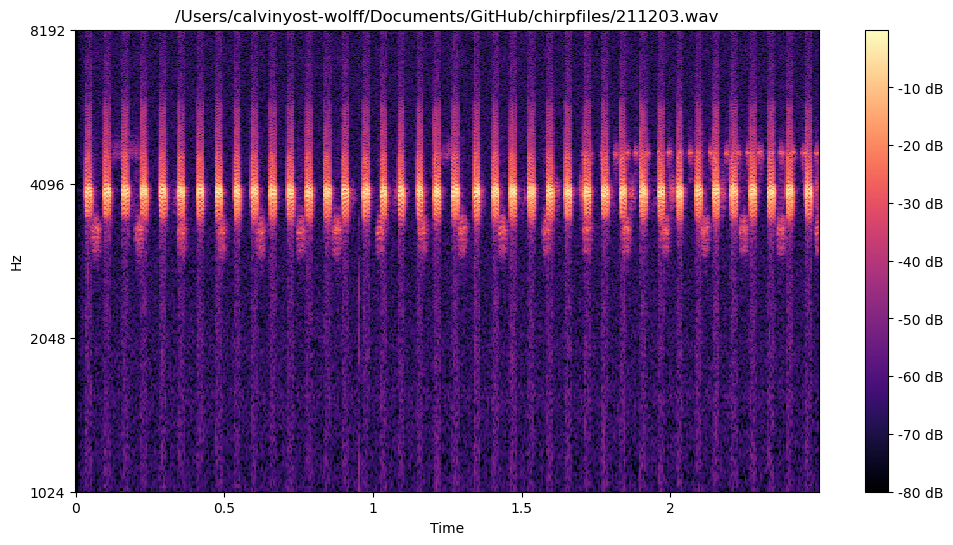

253
never reached end threshold


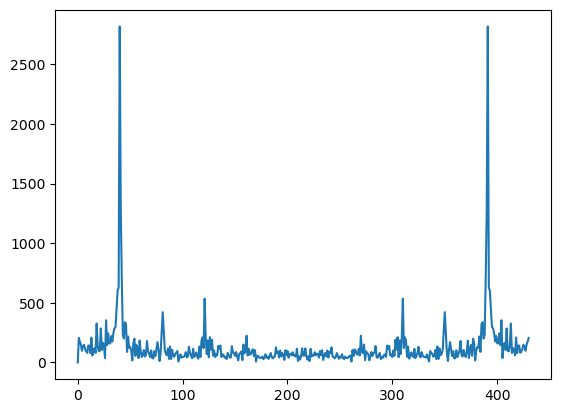

(40,)


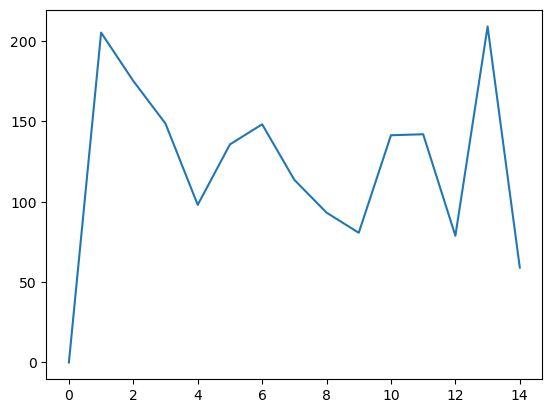

In [38]:
hop_length = 1024
n_fft = 2048
f = '/Users/calvinyost-wolff/Documents/GitHub/chirpfiles/211203.wav'
freq = 4096
D = remove_low(f)
data = D.sum(axis=0)
data = librosa.amplitude_to_db(data, ref=np.max)
print (data.shape)
DB = librosa.amplitude_to_db(D, ref=np.max)
print (DB.shape)
plt.figure(figsize=(12,6))
librosa.display.specshow(DB, hop_length=128, x_axis='time', y_axis='log');
plt.colorbar(format='%+2.0f dB');
plt.ylim(1024, 1024*8)
plt.title(str(f))
plt.show()
if wave_guess(data) != None:
    zero_index, min_guess, max_guess = wave_guess(data)
    print (zero_index, ',',min_guess, ',',max_guess)
    print (wave_length(data, zero_index, min_guess, max_guess))
    print (wave_length(data,zero_index,1,100))
    print ('ouput should be 11 for high freq or 23 for a specific other frequency')
fft = fft_wavelength(data)
plt.plot(fft)
plt.show()
print (np.unravel_index(np.argmax(fft), fft.shape))
plt.plot(fft[0:15])

In [67]:
def fft_file(f):
    D = remove_low(f)
    if D.shape[1] != 431:
        return [0]
    data = D.sum(axis=0)
    data2 = data- data.mean()
    fft = scipy.fft.fft(data2)
    out2 = np.absolute(fft)
    return out2

def get_fft_DB(directory):
    df = pd.read_csv('MLNS_Insects_fams_05212024.csv')

    columns = ['critter_name']
    for i in range(0,431):
        columns.append(i)
    
    out = pd.DataFrame(columns = columns)
    i = 0
    for filename in os.listdir(directory):
        f = os.path.join(directory, filename)
        # checking if it is a file
        i=i+1
        if i%100 == 0:
            print (100*i/len(os.listdir(directory)),' percent done')
        if os.path.isfile(f):
            if os.path.getsize(f) < 881000:
                continue
            #recover type
            file_name = float(filter_non_digits(f))
            critter_name = df.loc[df.cat_num==file_name].critter_name
            
            #recover fft
            fft = fft_file(f)
            if fft.shape[0] == 431:
                new_dict = {'critter_name': critter_name}
                for i in range(0,431):
                    new_dict[i] = fft[i]
                new_row = pd.DataFrame(new_dict)
                out = pd.concat([out, new_row])
    return out

In [46]:
def filter_non_digits(string):
    result = ''
    for char in string:
        if char in '1234567890':
            result += char
    return result 

In [68]:
directory = '/Users/calvinyost-wolff/Documents/GitHub/chirpfiles/NoTalk'
hop_length = 1024
n_fft = 2048

data = get_fft_DB(directory)

/var/folders/c7/3mttbbg11bl_11jhf9hbymzw0000gn/T/ipykernel_16938/2452870107.py:40: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  out = pd.concat([out, new_row])


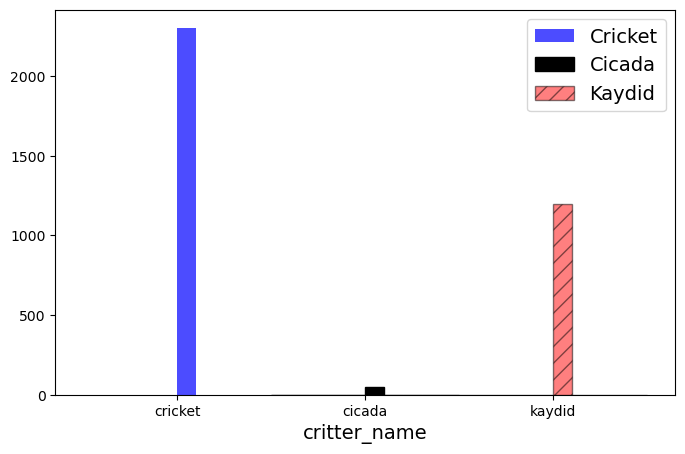

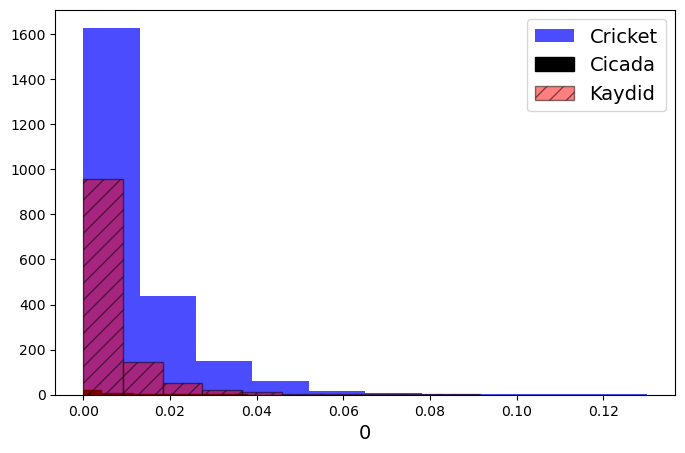

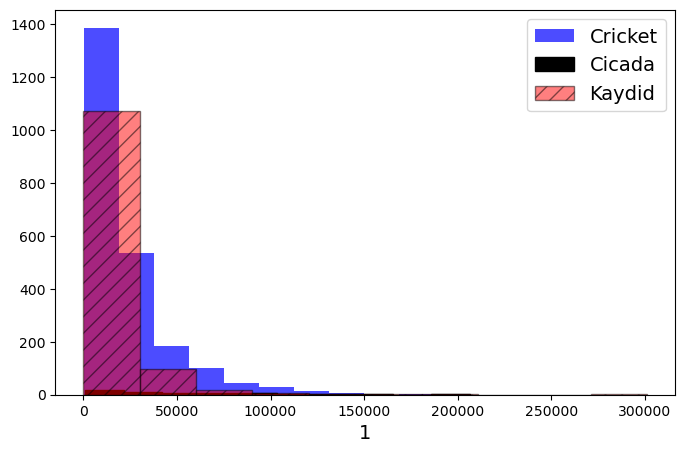

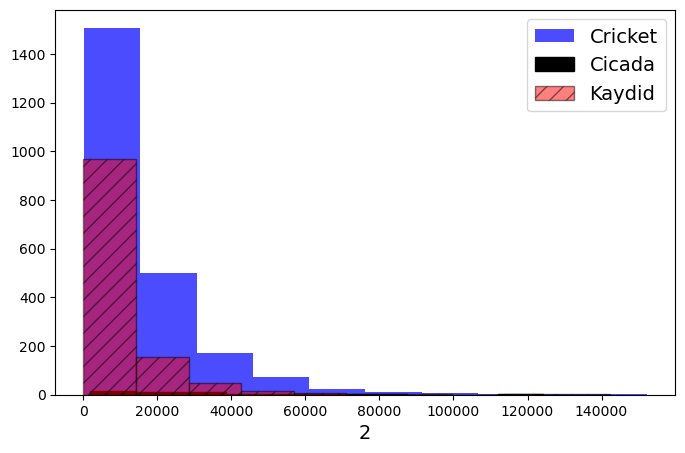

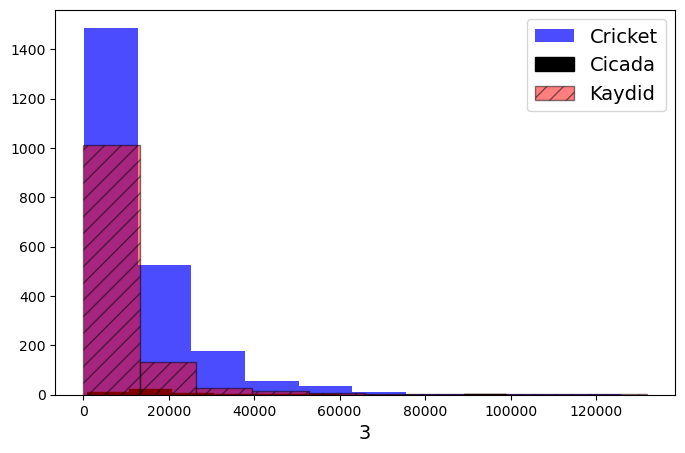

...

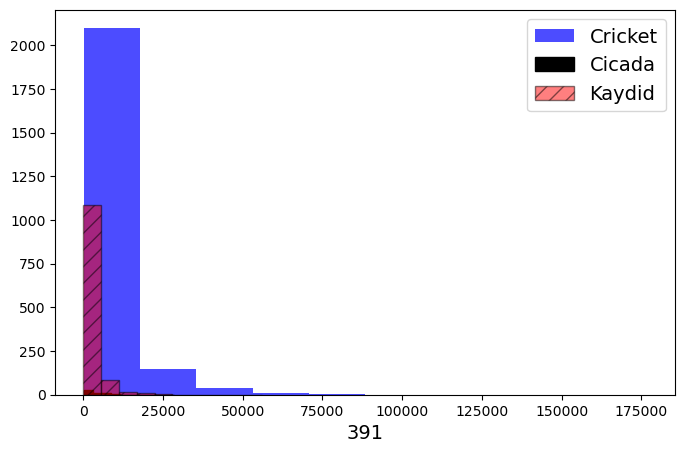

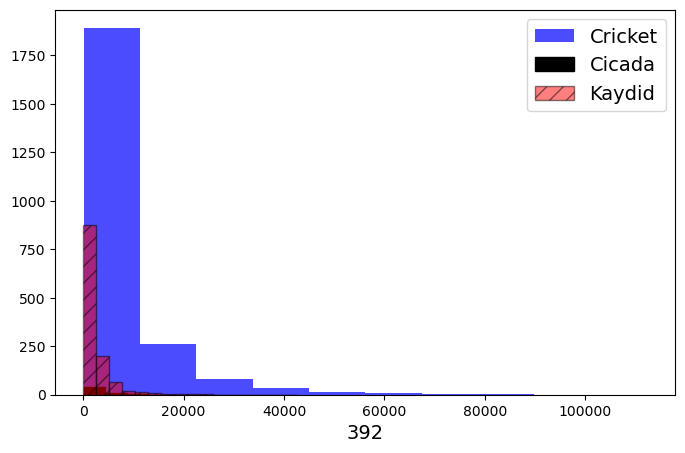

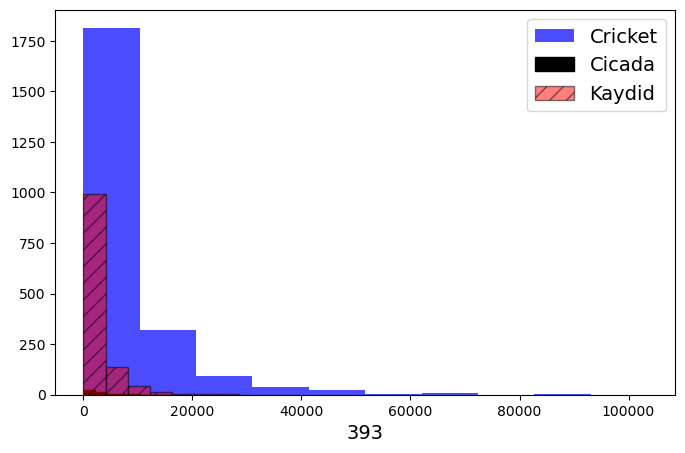

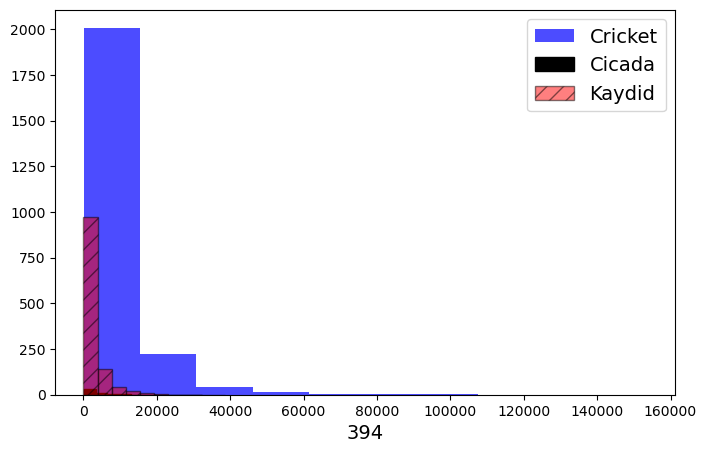

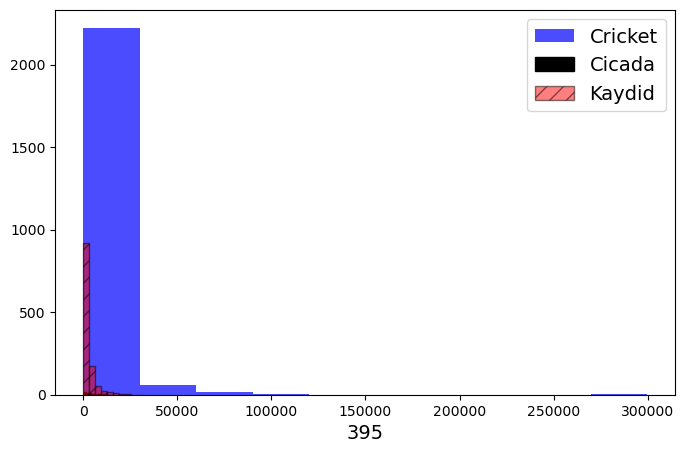

KeyboardInterrupt: 

In [69]:
for col in data.columns:
    plt.figure(figsize=(8,5))


    plt.hist(data.loc[data.critter_name=='cricket', col].values,
                color='blue',
                alpha=.7,
                label="Cricket")

    plt.hist(data.loc[data.critter_name=='cicada', col].values,
                color='black',
                alpha=1,
                hatch = '\\',
                edgecolor='black',
                label="Cicada")

    plt.hist(data.loc[data.critter_name=='kaydid', col].values,
            color='red',
            alpha=.5,
            hatch = '//',
            edgecolor='black',
            label="Kaydid")

    plt.xlabel(col, fontsize=14)
    plt.legend(fontsize=14)

    plt.show()

In [70]:
data.head(5)

,critter_name,0,1,2,3,4,5,6,7,8,...,421,422,423,424,425,426,427,428,429,430
126,cricket,0.035675,28113.558594,24111.990234,18947.685547,11192.242188,18826.171875,4476.935547,17679.601562,2562.397949,...,8203.106445,14114.850586,2562.397949,17679.601562,4476.935547,18826.171875,11192.242188,18947.685547,24111.990234,28113.558594
1755,kaydid,0.004028,24804.951172,29226.486328,11445.846680,10790.499023,5538.676758,4718.586914,2286.954834,5441.037598,...,3819.047607,4904.841309,5441.037598,2286.954834,4718.586914,5538.676758,10790.499023,11445.846680,29226.486328,24804.951172
1833,kaydid,0.014923,50934.253906,29161.675781,14551.841797,13833.727539,8850.432617,11308.352539,4896.038574,4992.692871,...,12400.579102,7147.672363,4992.692871,4896.038574,11308.352539,8850.432617,13833.727539,14551.841797,29161.675781,50934.253906
7299,cricket,0.000671,35411.679688,42960.644531,8553.935547,17418.787109,23591.267578,14264.907227,15277.236328,15208.188477,...,10943.161133,12434.767578,15208.188477,15277.236328,14264.907227,23591.267578,17418.787109,8553.935547,42960.644531,35411.679688
5657,cricket,0.017502,32059.339844,1429.871216,3233.253174,6157.281738,6152.311523,3798.972900,2088.823975,2172.749268,...,3295.500977,1517.477417,2172.749268,2088.823975,3798.972900,6152.311523,6157.281738,3233.253174,1429.871216,32059.339844


In [72]:
for i in range(0,43):
    string = 'range ' + str(10*i) + ' to ' + str((10*i+9)) 
    data[string] = data[10*i] + data[10*i+1] + data[10*i+2]+ data[10*i+3]+ data[10*i+4]+ data[10*i+5]+ data[10*i+6]+ data[10*i+7] + data[10*i+8]+ data[10*i+9]
    

In [73]:
data.head(5)

,critter_name,0,1,2,3,4,5,6,7,8,...,range 330 to 339,range 340 to 349,range 350 to 359,range 360 to 369,range 370 to 379,range 380 to 389,range 390 to 399,range 400 to 409,range 410 to 419,range 420 to 429
126,cricket,0.035675,28113.558594,24111.990234,18947.685547,11192.242188,18826.171875,4476.935547,17679.601562,2562.397949,...,18272.490234,16807.835938,30400.142578,30942.191406,30583.966797,39650.253906,49253.382812,54608.906250,70196.796875,129695.148438
1755,kaydid,0.004028,24804.951172,29226.486328,11445.846680,10790.499023,5538.676758,4718.586914,2286.954834,5441.037598,...,27224.070312,23863.535156,35563.488281,69134.210938,91462.812500,95307.062500,131178.718750,75096.453125,78057.820312,81397.882812
1833,kaydid,0.014923,50934.253906,29161.675781,14551.841797,13833.727539,8850.432617,11308.352539,4896.038574,4992.692871,...,18158.886719,18284.798828,22403.695312,22460.980469,33244.121094,28409.375000,48943.152344,40422.210938,74892.304688,119412.718750
7299,cricket,0.000671,35411.679688,42960.644531,8553.935547,17418.787109,23591.267578,14264.907227,15277.236328,15208.188477,...,26240.253906,24181.267578,49898.375000,34397.226562,36619.957031,36679.832031,64306.488281,36854.367188,49619.914062,167302.750000
5657,cricket,0.017502,32059.339844,1429.871216,3233.253174,6157.281738,6152.311523,3798.972900,2088.823975,2172.749268,...,6996.050293,10823.453125,10466.896484,5929.975098,11578.721680,9821.469727,14904.219727,12877.193359,25952.746094,32571.253906


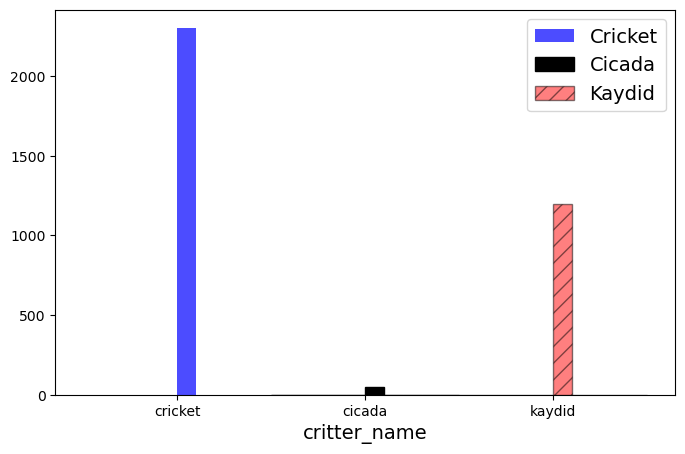

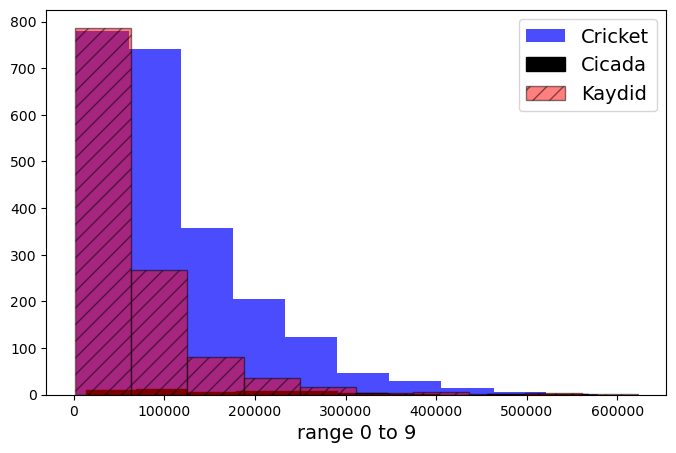

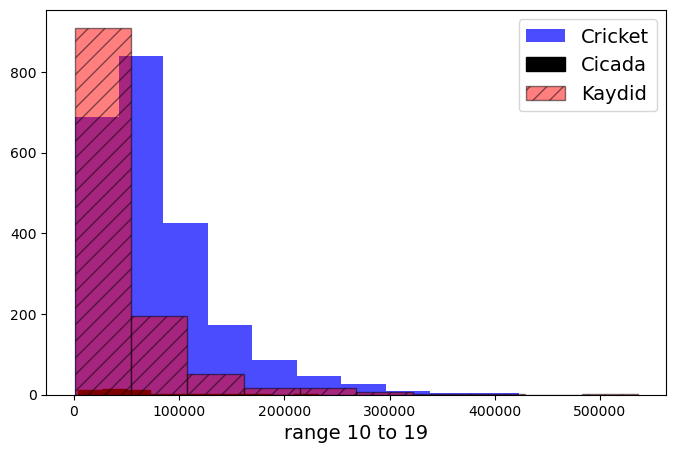

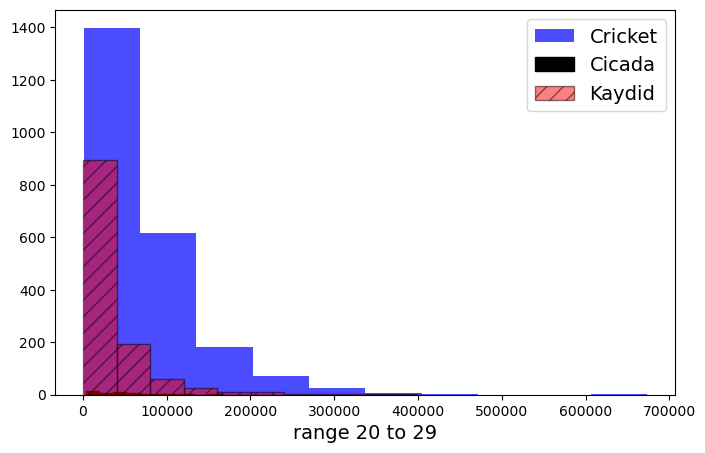

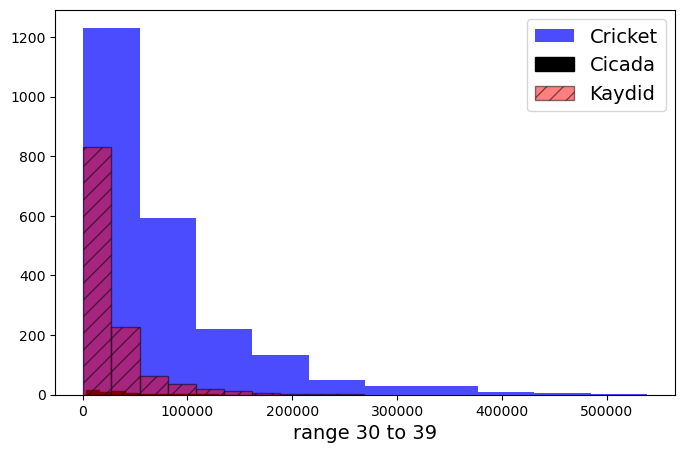

...

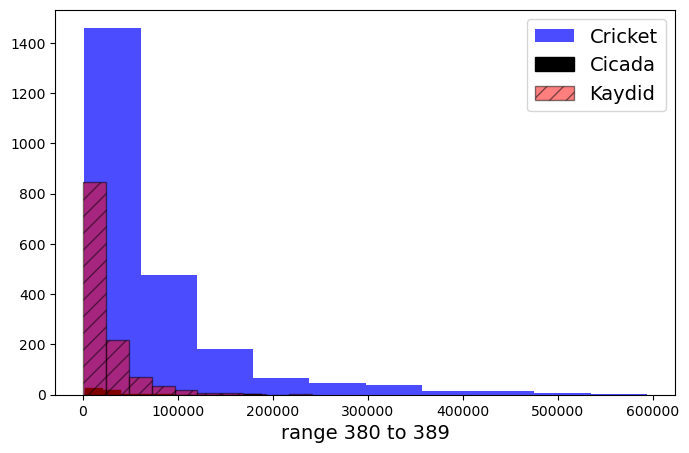

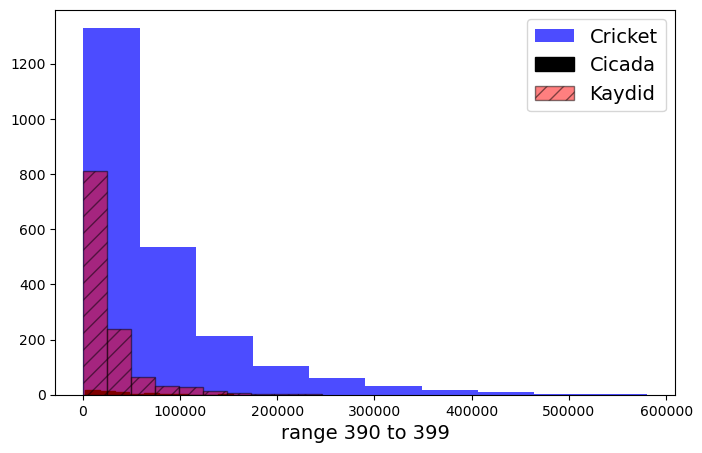

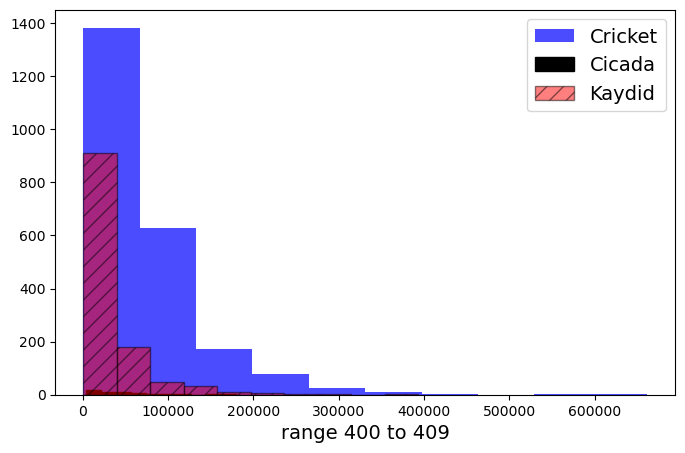

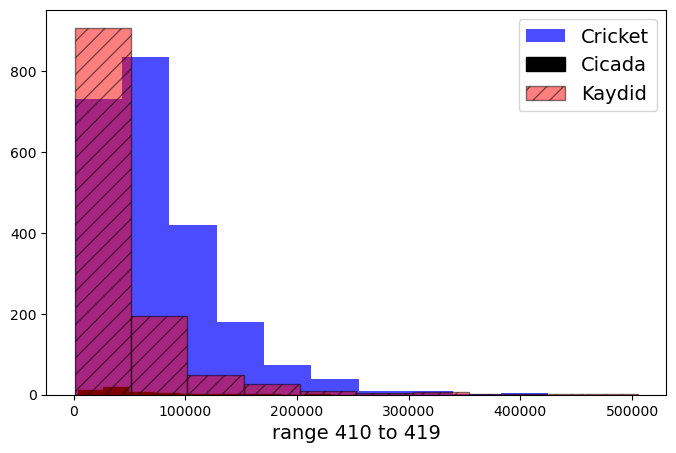

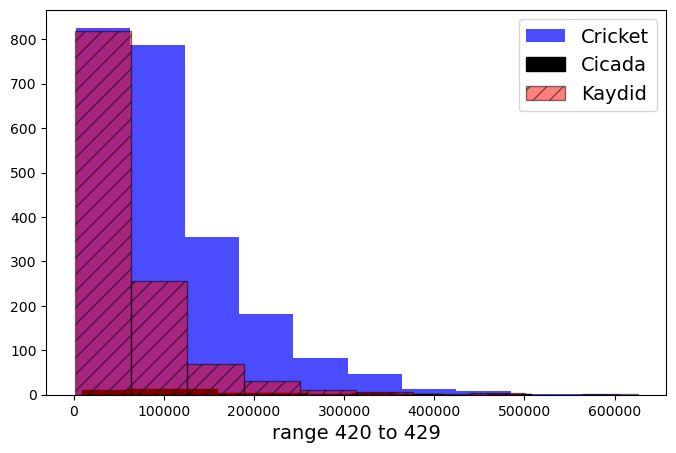

In [74]:
for col in data.columns:
    if type(col) != int:
        plt.figure(figsize=(8,5))
    
    
        plt.hist(data.loc[data.critter_name=='cricket', col].values,
                    color='blue',
                    alpha=.7,
                    label="Cricket")
    
        plt.hist(data.loc[data.critter_name=='cicada', col].values,
                    color='black',
                    alpha=1,
                    hatch = '\\',
                    edgecolor='black',
                    label="Cicada")
    
        plt.hist(data.loc[data.critter_name=='kaydid', col].values,
                color='red',
                alpha=.5,
                hatch = '//',
                edgecolor='black',
                label="Kaydid")
    
        plt.xlabel(col, fontsize=14)
        plt.legend(fontsize=14)
    
        plt.show()

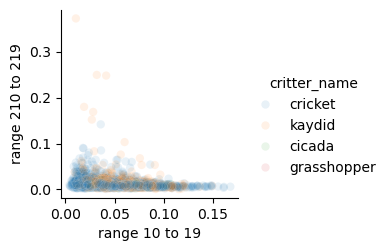

In [90]:
import seaborn as sns
sns.pairplot(data = data_normalized,
                x_vars = ['range 10 to 19'],
                y_vars = ['range 210 to 219'],
                hue = 'critter_name',
                plot_kws = {'alpha':.1})

plt.show()

In [93]:
print(data_normalized.groupby('critter_name')['range 10 to 19'].median())

critter_name
cicada         0.051874
cricket        0.044269
grasshopper    0.056356
kaydid         0.049309
Name: range 10 to 19, dtype: float64


In [94]:
print(data_normalized.groupby('critter_name')['range 30 to 39'].median())

critter_name
cicada         0.025668
cricket        0.032833
grasshopper    0.021021
kaydid         0.030888
Name: range 30 to 39, dtype: float64


In [91]:
print(data_normalized.groupby('critter_name')['range 0 to 9'].median())

critter_name
cicada         0.136941
cricket        0.054579
grasshopper    0.151678
kaydid         0.074059
Name: range 0 to 9, dtype: float64


In [82]:
data['normalizer'] = 0
for i in range(0,431):
    data['normalizer'] = data['normalizer'] + data[i]
data.head(5)

,critter_name,0,1,2,3,4,5,6,7,8,...,range 340 to 349,range 350 to 359,range 360 to 369,range 370 to 379,range 380 to 389,range 390 to 399,range 400 to 409,range 410 to 419,range 420 to 429,normalizer
126,cricket,0.035675,28113.558594,24111.990234,18947.685547,11192.242188,18826.171875,4476.935547,17679.601562,2562.397949,...,16807.835938,30400.142578,30942.191406,30583.966797,39650.253906,49253.382812,54608.906250,70196.796875,129695.148438,1.359009e+06
1755,kaydid,0.004028,24804.951172,29226.486328,11445.846680,10790.499023,5538.676758,4718.586914,2286.954834,5441.037598,...,23863.535156,35563.488281,69134.210938,91462.812500,95307.062500,131178.718750,75096.453125,78057.820312,81397.882812,1.918509e+06
1833,kaydid,0.014923,50934.253906,29161.675781,14551.841797,13833.727539,8850.432617,11308.352539,4896.038574,4992.692871,...,18284.798828,22403.695312,22460.980469,33244.121094,28409.375000,48943.152344,40422.210938,74892.304688,119412.718750,1.443083e+06
7299,cricket,0.000671,35411.679688,42960.644531,8553.935547,17418.787109,23591.267578,14264.907227,15277.236328,15208.188477,...,24181.267578,49898.375000,34397.226562,36619.957031,36679.832031,64306.488281,36854.367188,49619.914062,167302.750000,1.675456e+06
5657,cricket,0.017502,32059.339844,1429.871216,3233.253174,6157.281738,6152.311523,3798.972900,2088.823975,2172.749268,...,10823.453125,10466.896484,5929.975098,11578.721680,9821.469727,14904.219727,12877.193359,25952.746094,32571.253906,4.859521e+05


In [86]:
data_normalized = data

In [87]:
for col in data_normalized.columns[1:-1]:
    data_normalized[col] = data_normalized[col]/data_normalized['normalizer']

In [88]:
data_normalized.head(5)

,critter_name,0,1,2,3,4,5,6,7,8,...,range 340 to 349,range 350 to 359,range 360 to 369,range 370 to 379,range 380 to 389,range 390 to 399,range 400 to 409,range 410 to 419,range 420 to 429,normalizer
126,cricket,2.625078e-08,0.020687,0.017742,0.013942,0.008236,0.013853,0.003294,0.013009,0.001885,...,0.012368,0.022369,0.022768,0.022505,0.029176,0.036242,0.040183,0.051653,0.095434,1.359009e+06
1755,kaydid,2.099714e-09,0.012929,0.015234,0.005966,0.005624,0.002887,0.002460,0.001192,0.002836,...,0.012439,0.018537,0.036035,0.047674,0.049678,0.068375,0.039143,0.040687,0.042428,1.918509e+06
1833,kaydid,1.034112e-08,0.035295,0.020208,0.010084,0.009586,0.006133,0.007836,0.003393,0.003460,...,0.012671,0.015525,0.015565,0.023037,0.019687,0.033916,0.028011,0.051897,0.082748,1.443083e+06
7299,cricket,4.007189e-10,0.021136,0.025641,0.005105,0.010396,0.014081,0.008514,0.009118,0.009077,...,0.014433,0.029782,0.020530,0.021857,0.021892,0.038381,0.021997,0.029616,0.099855,1.675456e+06
5657,cricket,3.601554e-08,0.065972,0.002942,0.006653,0.012671,0.012660,0.007818,0.004298,0.004471,...,0.022273,0.021539,0.012203,0.023827,0.020211,0.030670,0.026499,0.053406,0.067026,4.859521e+05


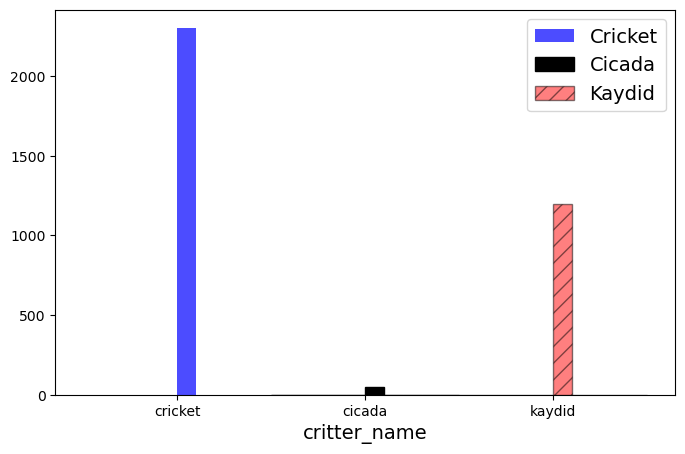

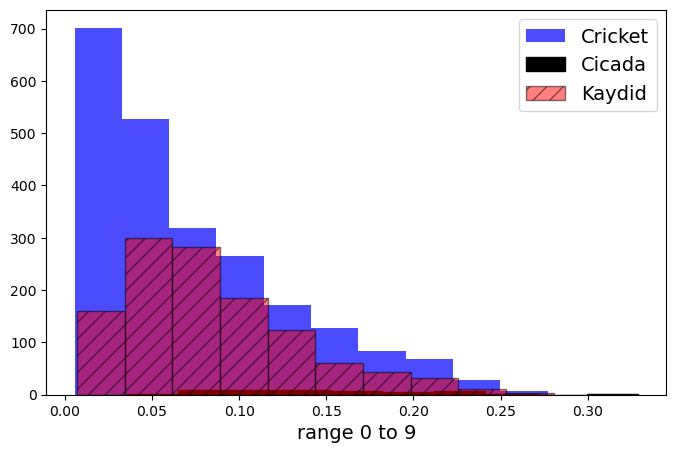

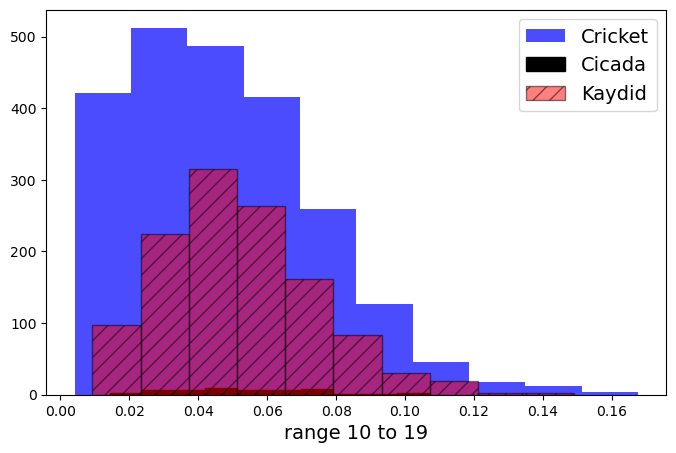

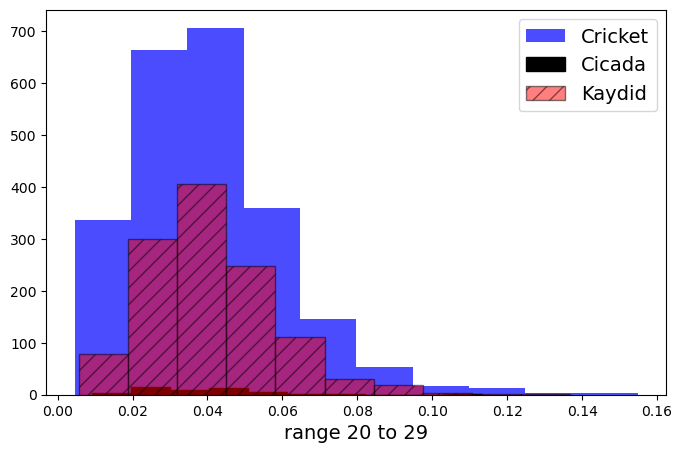

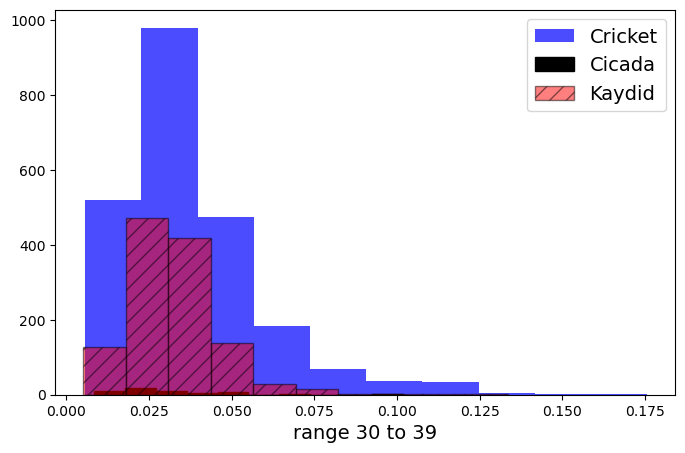

...

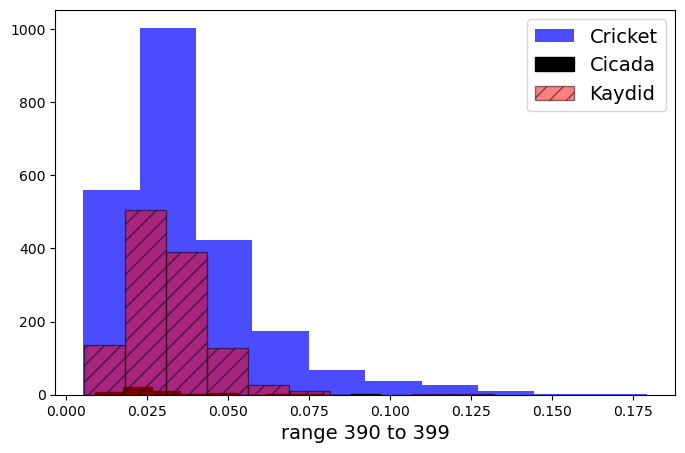

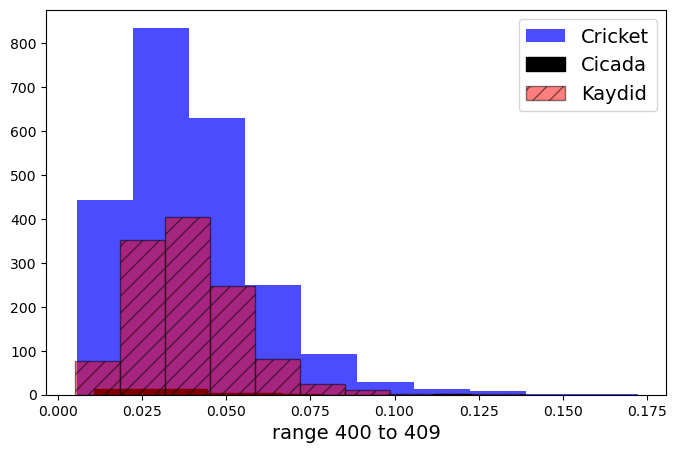

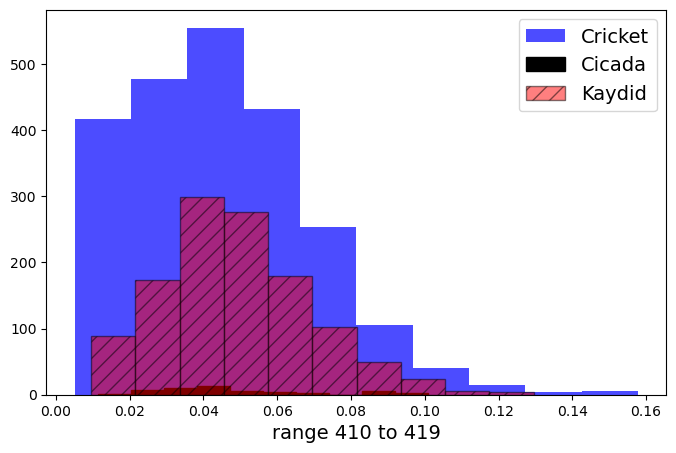

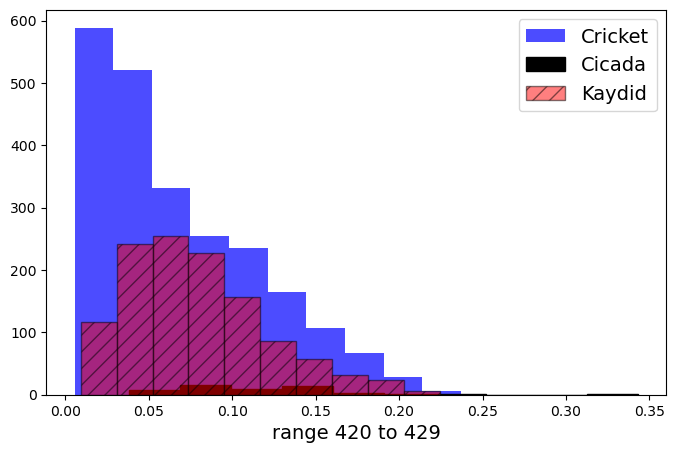

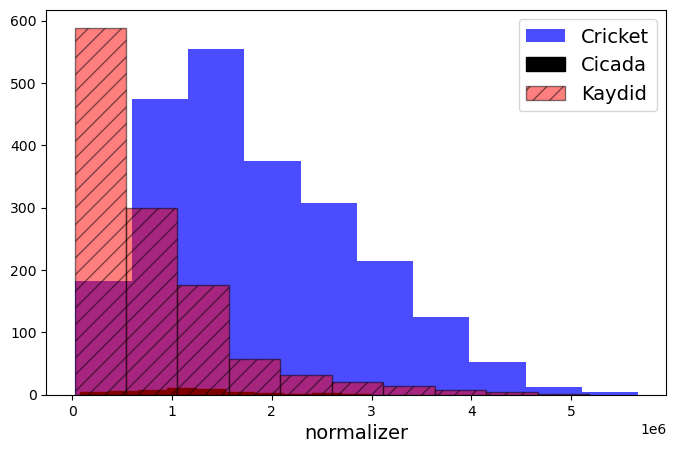

In [89]:
for col in data_normalized.columns:
    if type(col) != int:
        plt.figure(figsize=(8,5))
    
    
        plt.hist(data.loc[data.critter_name=='cricket', col].values,
                    color='blue',
                    alpha=.7,
                    label="Cricket")
    
        plt.hist(data.loc[data.critter_name=='cicada', col].values,
                    color='black',
                    alpha=1,
                    hatch = '\\',
                    edgecolor='black',
                    label="Cicada")
    
        plt.hist(data.loc[data.critter_name=='kaydid', col].values,
                color='red',
                alpha=.5,
                hatch = '//',
                edgecolor='black',
                label="Kaydid")
    
        plt.xlabel(col, fontsize=14)
        plt.legend(fontsize=14)
    
        plt.show()

In [97]:
print(data_normalized.groupby('critter_name')['range 0 to 9'].median())

critter_name
cicada         0.136941
cricket        0.054579
grasshopper    0.151678
kaydid         0.074059
Name: range 0 to 9, dtype: float64


In [98]:
print(data_normalized.groupby('critter_name')['range 10 to 19'].median())

critter_name
cicada         0.051874
cricket        0.044269
grasshopper    0.056356
kaydid         0.049309
Name: range 10 to 19, dtype: float64


In [99]:
print(data_normalized.groupby('critter_name')['range 20 to 29'].median())

critter_name
cicada         0.039280
cricket        0.037182
grasshopper    0.060502
kaydid         0.038228
Name: range 20 to 29, dtype: float64


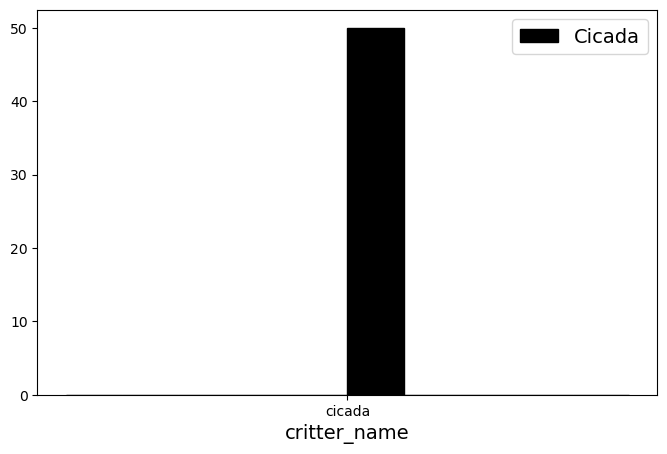

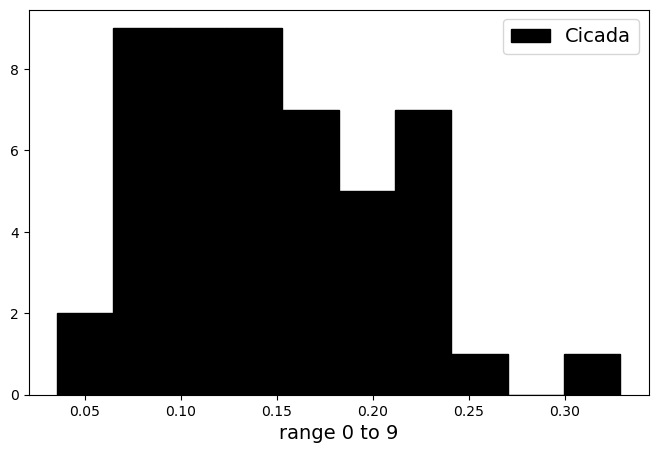

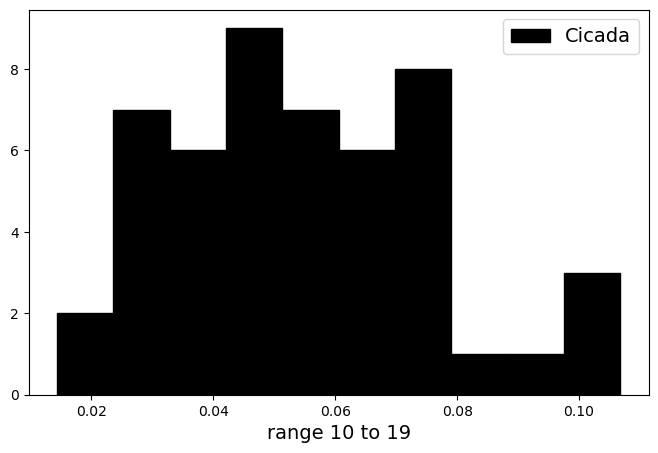

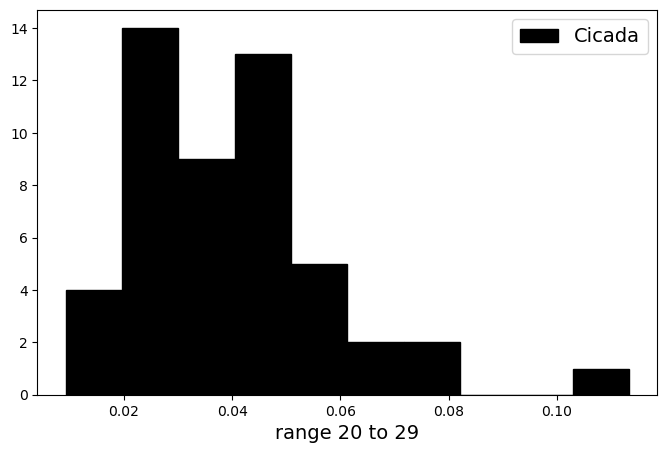

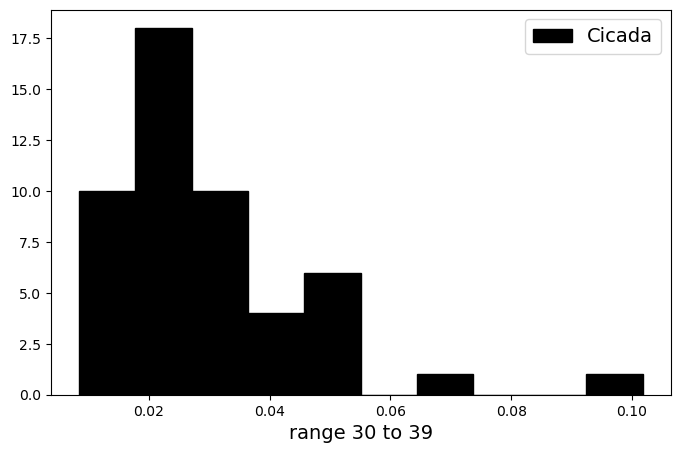

...

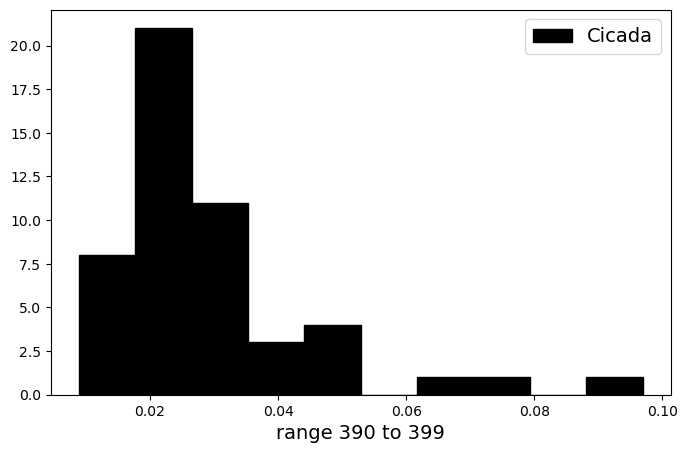

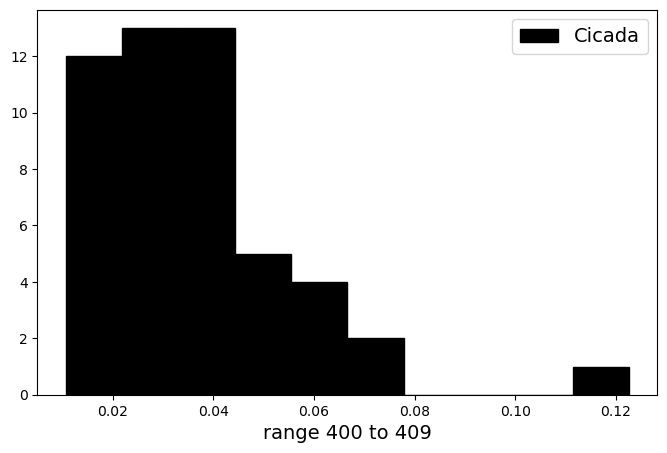

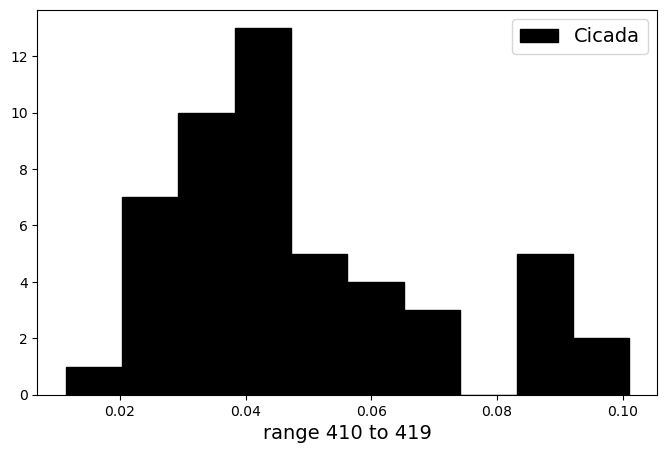

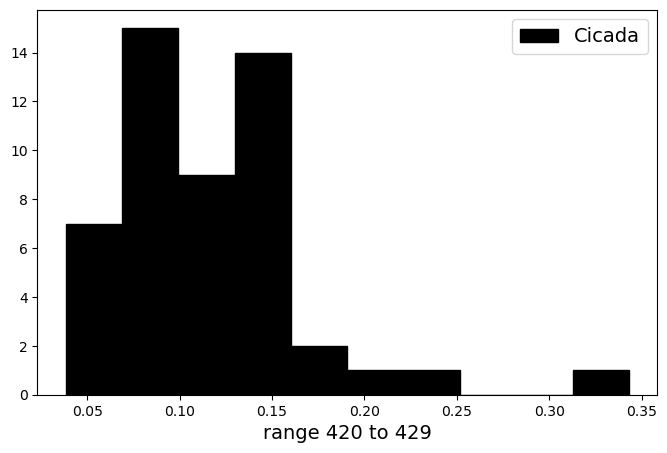

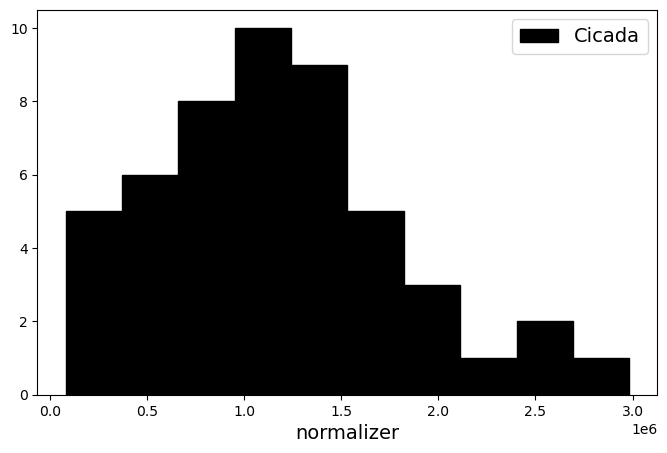

In [100]:
for col in data_normalized.columns:
    if type(col) != int:
        plt.figure(figsize=(8,5))
        
        plt.hist(data.loc[data.critter_name=='cicada', col].values,
                color='black',
                alpha=1,
                hatch = '//',
                edgecolor='black',
                label="Cicada")
    
        plt.xlabel(col, fontsize=14)
        plt.legend(fontsize=14)
    
        plt.show()